In [2]:
import pandas as pd
import numpy as np

In [13]:
images = pd.read_csv('images.csv')
images.head()

,image,sender_id,label,kids
0,4285fab0-751a-4b74-8e9b-43af05deee22,124,Not sure,False
1,ea7b6656-3f84-4eb3-9099-23e623fc1018,148,T-Shirt,False
2,00627a3f-0477-401c-95eb-92642cbe078d,94,Not sure,False
3,ea2ffd4d-9b25-4ca8-9dc2-bd27f1cc59fa,43,T-Shirt,False
4,3b86d877-2b9e-4c8b-a6a2-1d87513309d0,189,Shoes,False


In [14]:
images.drop(['sender_id','kids'], axis=1,inplace=True)

In [15]:
images.head()

,image,label
0,4285fab0-751a-4b74-8e9b-43af05deee22,Not sure
1,ea7b6656-3f84-4eb3-9099-23e623fc1018,T-Shirt
2,00627a3f-0477-401c-95eb-92642cbe078d,Not sure
3,ea2ffd4d-9b25-4ca8-9dc2-bd27f1cc59fa,T-Shirt
4,3b86d877-2b9e-4c8b-a6a2-1d87513309d0,Shoes


In [6]:
# Classes and their counts within the dataset
images['label'].value_counts()

T-Shirt       1011
Longsleeve     699
Pants          692
Shoes          431
Shirt          378
Dress          357
Outwear        312
Shorts         308
Not sure       228
Hat            171
Skirt          155
Polo           120
Undershirt     118
Blazer         109
Hoodie         100
Body            69
Other           67
Top             43
Blouse          23
Skip            12
Name: label, dtype: int64

In [6]:
df.loc[df['label']=='Not sure','label'] = 'Not_sure'

In [16]:
#Add suffix '.jpg' to all image files.

images['image'] = images['image'] + '.jpg'

In [17]:
images.head()

,image,label
0,4285fab0-751a-4b74-8e9b-43af05deee22.jpg,Not sure
1,ea7b6656-3f84-4eb3-9099-23e623fc1018.jpg,T-Shirt
2,00627a3f-0477-401c-95eb-92642cbe078d.jpg,Not sure
3,ea2ffd4d-9b25-4ca8-9dc2-bd27f1cc59fa.jpg,T-Shirt
4,3b86d877-2b9e-4c8b-a6a2-1d87513309d0.jpg,Shoes


In [9]:
!pip install opencv-python
from matplotlib import pyplot as plt
import cv2

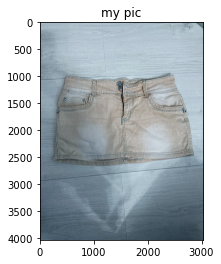

In [10]:
img = cv2.imread(
    r"/Users/mahejabeenabdul/Documents/270 project/images_original/0ab26941-211e-44d7-a62a-20207fa7a3e0.jpg")

plt.imshow(img)
plt.title('my pic')
plt.show()

In [11]:
!pip install pillow
import pandas as pd
import os
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from PIL import Image,ImageStat
import numpy as np
import warnings
warnings.filterwarnings('ignore')
from IPython.display import display
import random

In [18]:
images.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5403 entries, 0 to 5402
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   5403 non-null   object
 1   label   5403 non-null   object
dtypes: object(2)
memory usage: 84.5+ KB


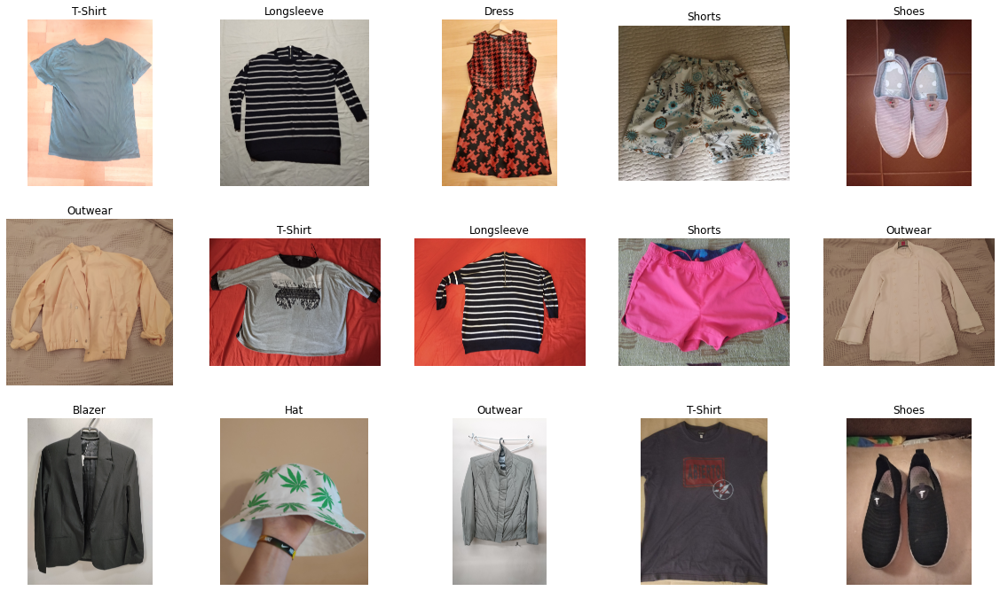

In [19]:
dataset=r"/Users/mahejabeenabdul/Documents/270 project/images_original"
def show_random_image():
    random_index = random.choice(images.index)
    img_path = images['image'][random_index]
    label = images['label'][random_index]
    complete_path = dataset + '/' + img_path
    image = mpimg.imread(complete_path)
    plt.imshow(image)
    plt.axis('off')
    plt.title(label)
plt.figure(figsize=(20, 20))
for i in range(15):
    ax = plt.subplot(5, 5, i+1)
    show_random_image()

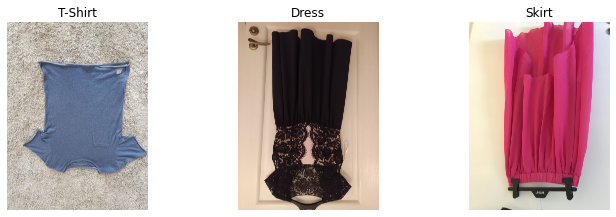

In [25]:
#rotating the image
def aug_random_image():
    random_index = random.choice(images.index)
    img_path = images['image'][random_index]
    label = images['label'][random_index]
    complete_path = dataset + '/' + img_path
    image = Image.open(complete_path)
    vertical_img = image.transpose(method=Image.FLIP_TOP_BOTTOM)
    plt.imshow(vertical_img)
    plt.axis('off')
    plt.title(label)
plt.figure(figsize=(20, 20))
for i in range(3):
    ax = plt.subplot(5, 5, i+1)
    aug_random_image()

In [22]:
#checking for incomplete data (exceptions)
error=0
for filename in os.listdir(r'/Users/mahejabeenabdul/Documents/270 project/images_original'):
    try:
        with Image.open(r'/Users/mahejabeenabdul/Documents/270 project/images_original//'+filename) as img: # open the image file
            img.verify()  # verify that it is, in fact an image
    except (IOError, SyntaxError) as e:
        print(filename,e)
        error=error+1
        #os.remove(r'/Users/mahejabeenabdul/Documents/270 project/images_original//'+filename) #to remove incomplete 
if error==0:
    print("There are no Incomplete images!") 

There are no Incomplete images!


In [26]:
#checking for null values
images.isnull().sum()

image    0
label    0
dtype: int64

In [40]:
im = Image.open(
    r"/Users/mahejabeenabdul/Documents/270 project/images_original/00627a3f-0477-401c-95eb-92642cbe078d.jpg")

In [41]:
im.show()

In [42]:
#show the bands of image
im.getbands()

('R', 'G', 'B')

In [43]:
#show the pixel format used by the image
im.mode

'RGB'

In [44]:
#convert all the images to RGB
if im.mode in ("RGBA", "P"): 
    im = im.convert("RGB")

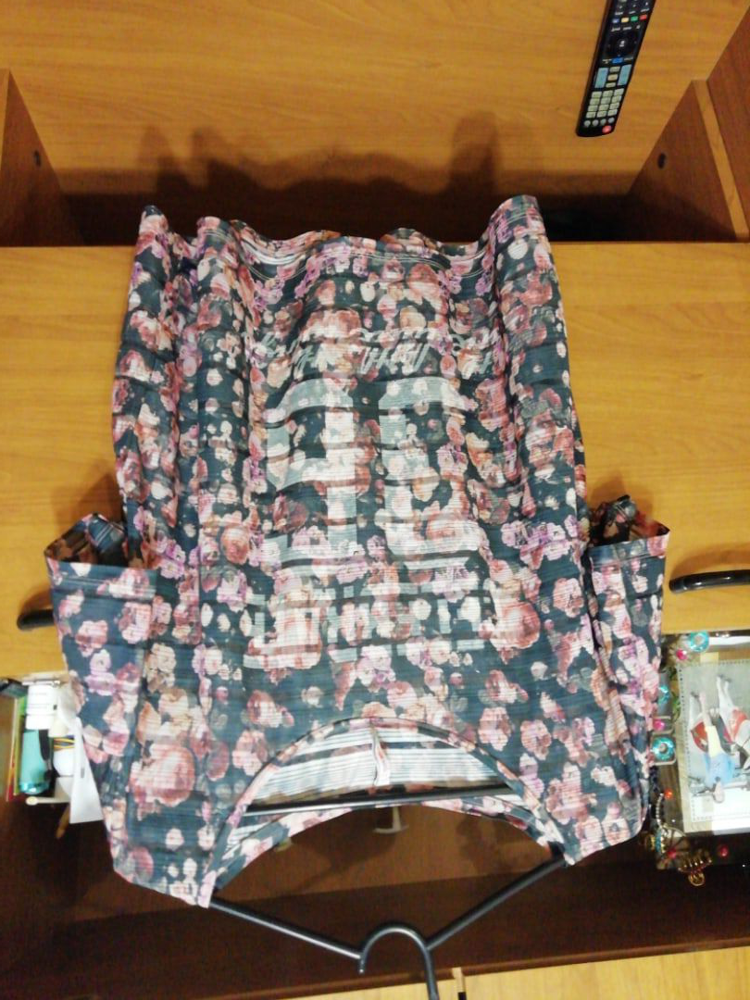

In [45]:
#rotating image
rotated = im.rotate(180)
rotated

In [46]:
#converting image to numpy array
im_array = np.array(im)

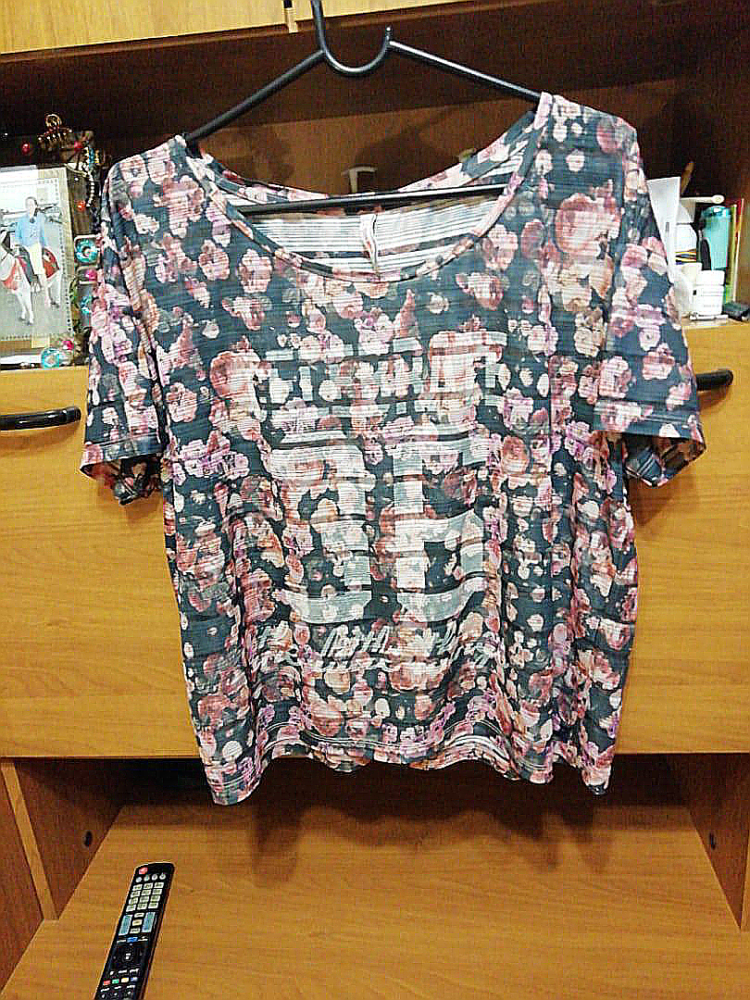

In [47]:
#increasing sharpness
from PIL import ImageEnhance
enhancer = ImageEnhance.Sharpness(im)
enhancer.enhance(10.0)

In [48]:
im.info['dpi']

(72, 72)

In [49]:
def plot_comparison(img_original, img_filtered, img_title_filtered):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 8), sharex=True, sharey=True)
    ax1.imshow(img_original, cmap=plt.cm.gray)
    ax1.set_title('Original')
    ax1.axis('off')
    ax2.imshow(img_filtered, cmap=plt.cm.gray)
    ax2.set_title(img_title_filtered)
    ax2.axis('off')

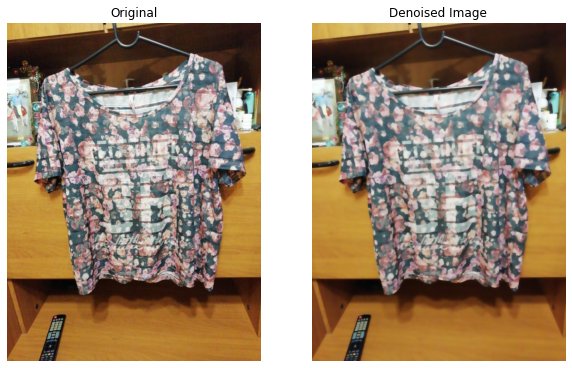

In [50]:
from skimage.restoration import denoise_tv_chambolle

noisy_image = plt.imread(
    r"/Users/mahejabeenabdul/Documents/270 project/images_original/00627a3f-0477-401c-95eb-92642cbe078d.jpg")

# Apply total variation filter denoising
denoised_image = denoise_tv_chambolle(noisy_image, multichannel=True)

# Show the noisy and denoised image
plot_comparison(noisy_image, denoised_image, 'Denoised Image')

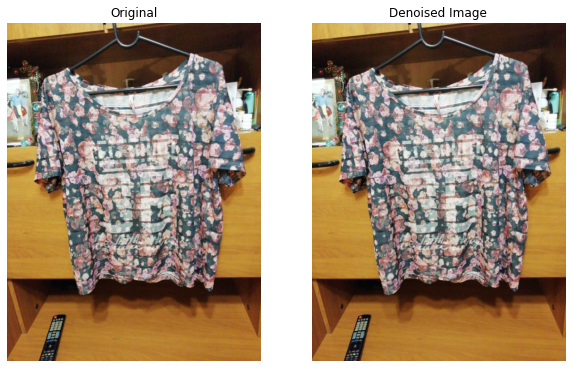

In [51]:
from skimage.restoration import denoise_bilateral

noisy_image1 = plt.imread(
    r"/Users/mahejabeenabdul/Documents/270 project/images_original/00627a3f-0477-401c-95eb-92642cbe078d.jpg")

# Apply bilateral filter denoising
denoised_image1 = denoise_bilateral(noisy_image1, multichannel=True)

# Show original and resulting images
plot_comparison(noisy_image1, denoised_image1, 'Denoised Image')

In [52]:
#size of image in pixels
print(f'Size of image :{im.size}')
  
# fetching the dimensions
wid, hgt = im.size
  
# displaying the dimensions
print(f'Resolution of image : {str(wid) + "x" + str(hgt)}')

Size of image :(810, 1080)
Resolution of image : 810x1080


In [53]:
#Displaying the resolution of sample images
images = []
resolutions = []
for filename in os.listdir(r'/Users/mahejabeenabdul/Documents/270 project/images_original'):
    with Image.open(r'/Users/mahejabeenabdul/Documents/270 project/images_original//'+filename) as img:
        wid, hgt = img.size
        images.append(filename)
        resolutions.append(str(wid) + "x" + str(hgt))
resolution_images = pd.DataFrame({'Image_Name': images, 'Resolution': resolutions})
resolution_images.sample(10)

,Image_Name,Resolution
3825,c674b492-752b-4a36-a0c5-9092759a9c2a.jpg,3120x4160
3483,28709ef4-cebf-40c5-8347-f59932bf9323.jpg,3024x4032
2998,194dd900-a3ed-4df7-a9bf-37f0d4630476.jpg,3016x4032
5717,ec6e46ad-9be8-482d-b67a-8371bbf43326.jpg,3120x4160
3909,a0a6a791-141f-4a5c-adab-84941f073e90.jpg,3016x4032
3038,8562c30c-623c-49b5-8a9b-b7fefae16eda.jpg,3472x4624
128,1bbe653c-dbc8-4a01-b3a5-531aef8a5f38.jpg,3456x4608
2787,1745b197-af72-4d7c-ad73-9967ddad5d21.jpg,3016x3455
5484,bc492f26-f7d2-4065-92fb-65b6df7b4ea5.jpg,750x1000
5423,58a89ae2-5ea0-4c00-96c7-2476e7d9b3f2.jpg,3024x4032


In [54]:
# changing quality
im.save('image.jpg', quality=95)

In [55]:
#close image
im.close()

In [57]:
import pathlib
maxsize = (450, 600)
for input_img_path in pathlib.Path(r'/Users/mahejabeenabdul/Documents/270 project/images_original').iterdir():
    output_img_path = str(input_img_path).replace("images_original","images_resized")
    with Image.open(input_img_path) as im:
        if im.mode in ("RGBA", "P"): 
            im = im.convert("RGB")
        #Smaller image to preserve the aspect of the image
        im.thumbnail(maxsize)
        im.save(output_img_path, dpi=(300,300))
        print(f"processing file {input_img_path} done...")

processing file /Users/mahejabeenabdul/Documents/270 project/images_original/d7ed1d64-2c65-427f-9ae4-eb4aaa3e2389.jpg done...
processing file /Users/mahejabeenabdul/Documents/270 project/images_original/5c1b7a77-1fa3-4af8-9722-cd38e45d89da.jpg done...
processing file /Users/mahejabeenabdul/Documents/270 project/images_original/b2e084c7-e3a0-4182-8671-b908544a7cf2.jpg done...
processing file /Users/mahejabeenabdul/Documents/270 project/images_original/9d053b67-64e1-4050-a509-27332b9eca54.jpg done...
processing file /Users/mahejabeenabdul/Documents/270 project/images_original/d885f493-1070-4d51-bd11-f1ec156a2aa7.jpg done...
processing file /Users/mahejabeenabdul/Documents/270 project/images_original/87846aa9-86cc-404a-af2c-7e8fe941081d.jpg done...
processing file /Users/mahejabeenabdul/Documents/270 project/images_original/22745622-ae32-407f-9af1-9a25eb79d7b3.jpg done...
processing file /Users/mahejabeenabdul/Documents/270 project/images_original/04fa06fb-d71a-4293-9804-fe799375a682.jpg 

In [58]:
#Displaying the resolution of sample images after resizing
images = []
resolutions = []
for filename in os.listdir(r'/Users/mahejabeenabdul/Documents/270 project/images_resized'):
    with Image.open(r'/Users/mahejabeenabdul/Documents/270 project/images_resized//'+filename) as img:
        wid, hgt = img.size
        images.append(filename)
        resolutions.append(str(wid) + "x" + str(hgt))
resolution_images = pd.DataFrame({'Image_Name': images, 'Resolution': resolutions})
resolution_images.sample(10)

,Image_Name,Resolution
2601,7ba8dcbc-3c46-4b73-948b-95a8f16a91fb.jpg,450x338
4867,c9ae97dd-eeb4-4ada-b7e2-b2728cf5758f.jpg,450x600
44,4cc0191c-175d-48e1-9808-ffbb7ea7ac57.jpg,450x253
4106,3975a9b1-ef23-4688-95f8-3500c1850c1b.jpg,450x600
1061,475d03c5-3317-4877-b13d-e2142b33bb70.jpg,450x253
1607,b7935371-743f-4ad4-9a48-fdb9d0bca9e4.jpg,450x338
4087,7248be0f-4c8d-4aa9-a276-419fe8043142.jpg,449x600
4206,35cc16d1-d4e6-4970-b0dd-0938053dd82a.jpg,450x512
3085,fb0e4090-f7e7-424a-aa85-44daffcea9a1.jpg,450x404
5466,02fc081e-5598-424e-9ab7-fc92eba1cda3.jpg,450x337


In [59]:
for input_img_path in pathlib.Path(r'/Users/mahejabeenabdul/Documents/270 project/images_original').iterdir():
    output_img_path = str(input_img_path).replace("images_original","images_resized_f")
    with Image.open(input_img_path) as img:
        if img.mode in ("RGBA", "P"): 
            img = img.convert("RGB")
        #resizing to fixed size
        img = img.resize((600,600))
        img.save(output_img_path, "JPEG", dpi=(300,300))

In [60]:
#Displaying the resolution of sample images after resizing(fixed)
images = []
resolutions = []
for filename in os.listdir(r'/Users/mahejabeenabdul/Documents/270 project/images_resized_f'):
    with Image.open(r'/Users/mahejabeenabdul/Documents/270 project/images_resized_f//'+filename) as img:
        wid, hgt = img.size
        images.append(filename)
        resolutions.append(str(wid) + "x" + str(hgt))
resolution_images = pd.DataFrame({'Image_Name': images, 'Resolution': resolutions})
resolution_images.sample(10)

,Image_Name,Resolution
5120,d002bff9-c9a1-402a-b41d-c34c344d57b0.jpg,600x600
4017,3f0123ba-6933-4d5a-b9d0-01cd913bce09.jpg,600x600
869,67242183-82be-491d-84cb-cd0ae9d00e19.jpg,600x600
3602,84971313-7ca7-4193-b8a5-0926e1a5ac0d.jpg,600x600
4454,e7a3590f-7886-426b-88b7-67bc0efe0135.jpg,600x600
132,5d772eec-4af3-4f6b-9615-6b1c75b1adb2.jpg,600x600
2869,f9b5db75-cc6e-4883-ba11-2ef61dd58371.jpg,600x600
5094,f5c71807-a74b-422f-b551-6ca6a1197a57.jpg,600x600
3501,2d88dcfb-2418-49fa-82b2-b5d4500ed542.jpg,600x600
2050,7a2a6c18-1b14-49f1-80e1-a0ec88a59532.jpg,600x600


### PCA

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import cv2
from scipy.stats import stats
import matplotlib.image as mpimg

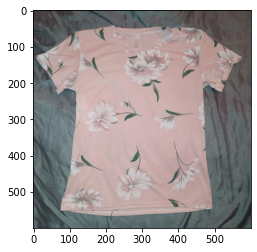

In [6]:
img1 = cv2.cvtColor(cv2.imread(
    '/Users/mahejabeenabdul/Documents/270 project/images_resized_f/16f1fbdf-d339-40f6-aecb-e55199db7a96.jpg'), cv2.COLOR_BGR2RGB)
plt.imshow(img1)
plt.show()

In [7]:
img1.shape

(600, 600, 3)

In [8]:
#Splitting into channels
r,g,b = cv2.split(img1)

#normalizing 
r,g,b = r/255,g/255,b/255

In [9]:
pca_components = 50
pca_r = PCA(n_components=pca_components)
reduced_r = pca_r.fit_transform(r)

pca_g = PCA(n_components=pca_components)
reduced_g = pca_g.fit_transform(g)

pca_b = PCA(n_components=pca_components)
reduced_b = pca_b.fit_transform(b)

In [10]:
print(reduced_r.shape)
print(reduced_g.shape)
print(reduced_b.shape)

(600, 50)
(600, 50)
(600, 50)


In [11]:
combined = np.array([reduced_r,reduced_g,reduced_b])
reconstructed_r = pca_r.inverse_transform(reduced_r)
reconstructed_g = pca_g.inverse_transform(reduced_g)
reconstructed_b = pca_b.inverse_transform(reduced_b)

img_reduced = (cv2.merge((reconstructed_r,reconstructed_g,reconstructed_b)))

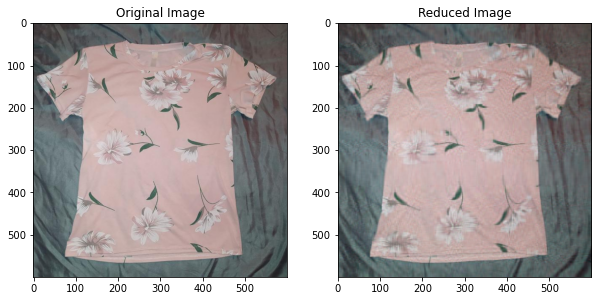

In [12]:
fig = plt.figure(figsize = (10, 7.2)) 
fig.add_subplot(121)
plt.title("Original Image")
plt.imshow(img1)
fig.add_subplot(122)
plt.title("Reduced Image")
plt.imshow(img_reduced)
plt.show()

In [13]:
import sys
sys.getsizeof(img1)

1080136

In [29]:
sys.getsizeof(img_reduced)

8640136

### SVD

In [22]:
import numpy
from PIL import Image

In [19]:
# open the image and return 3 matrices, each corresponding to one channel (r, g, b)
def openimag(imgpath):
    imorig = Image.open(imgpath)
    im = numpy.array(imorig)

    ar = im[:, :, 0]
    ag = im[:, :, 1]
    ab = im[:, :, 2]

    return [ar, ag, ab, imorig]

In [20]:
# compress the matrix of a single channel
def compresschannel(channel_matrix, singular_value_limit):
    u, s, v = numpy.linalg.svd(channel_matrix)
    acompressed = numpy.zeros((channel_matrix.shape[0], channel_matrix.shape[1]))
    k = singular_value_limit

    left_side = numpy.matmul(u[:, 0:k], numpy.diag(s)[0:k, 0:k])
    acompressed_Inner = numpy.matmul(left_side, v[0:k, :])
    acompressed = acompressed_Inner.astype('uint8')
    return acompressed

In [23]:
ar, ag, ab, imorig = openimag(
    '/Users/mahejabeenabdul/Documents/270 project/images_resized_f/16f1fbdf-d339-40f6-aecb-e55199db7a96.jpg')

# number of singular values to use for reconstructing the compressed image
singular_value_limit = 200

In [24]:
arcompressed = compresschannel(ar, singular_value_limit)
agcompressed = compresschannel(ag, singular_value_limit)
abcompressed = compresschannel(ab, singular_value_limit)

imr = Image.fromarray(arcompressed, mode=None)
img = Image.fromarray(agcompressed, mode=None)
imb = Image.fromarray(abcompressed, mode=None)

newimg = Image.merge("RGB", (imr, img, imb))

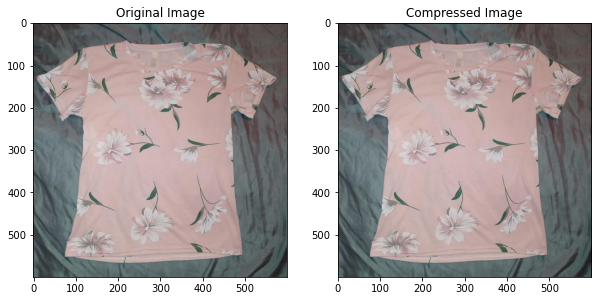

In [25]:
fig = plt.figure(figsize = (10, 7.2)) 
fig.add_subplot(121)
plt.title("Original Image")
plt.imshow(imorig)
fig.add_subplot(122)
plt.title("Compressed Image")
plt.imshow(newimg)
plt.show()

In [26]:
import sys
sys.getsizeof(imorig)

48

In [27]:
sys.getsizeof(newimg)

48

In [61]:
# image width and height:
imageWidth = 600
imageHeight = 600

# CALCULATE AND DISPLAY THE COMPRESSION RATIO
mr = imageHeight
mc = imageWidth

originalSize = mr * mc * 3
compressedSize = singular_value_limit * (1 + mr + mc) * 3

print('original size:')
print(originalSize)

print('compressed size:')
print(compressedSize)

print('Ratio compressed size / original size:')
ratio = compressedSize * 1.0 / originalSize
print(ratio)

print('Compressed image size is ' + str(round(ratio * 100, 2)) + '% of the original image ')

original size:
1080000
compressed size:
720600
Ratio compressed size / original size:
0.6672222222222223
Compressed image size is 66.72% of the original image 


In [22]:
!pip install imgaug
!pip install ipyplot
import imageio
import imgaug as ia
import imgaug.augmenters as iaa

In [35]:
input_image = imageio.imread(
    r"/Users/mahejabeenabdul/Documents/270 project/images_resized_f/00a1b7a8-217d-45bf-93a8-86db0bdf9d9d.jpg")

In [36]:
import warnings
warnings.filterwarnings('ignore')
from IPython.display import display
import random

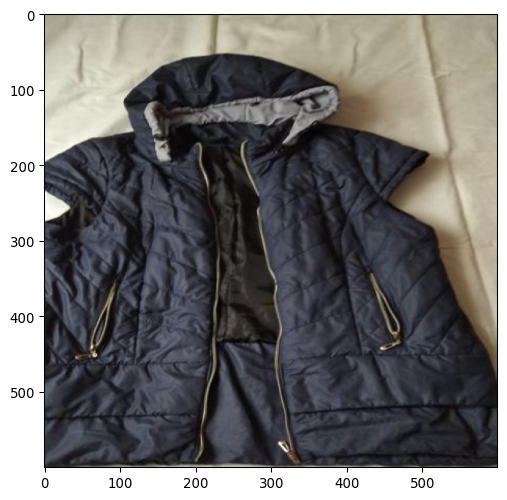

In [54]:
crop1 = iaa.Crop(percent=(0, 0.3)) 
crop_image = crop1.augment_image(input_image)
ia.imshow(crop_image)

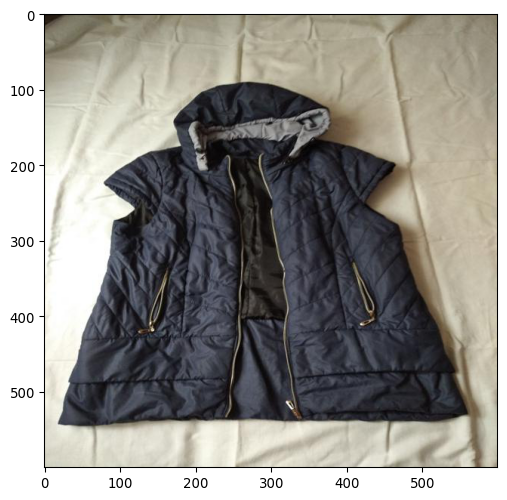

In [26]:
ia.imshow(input_image)

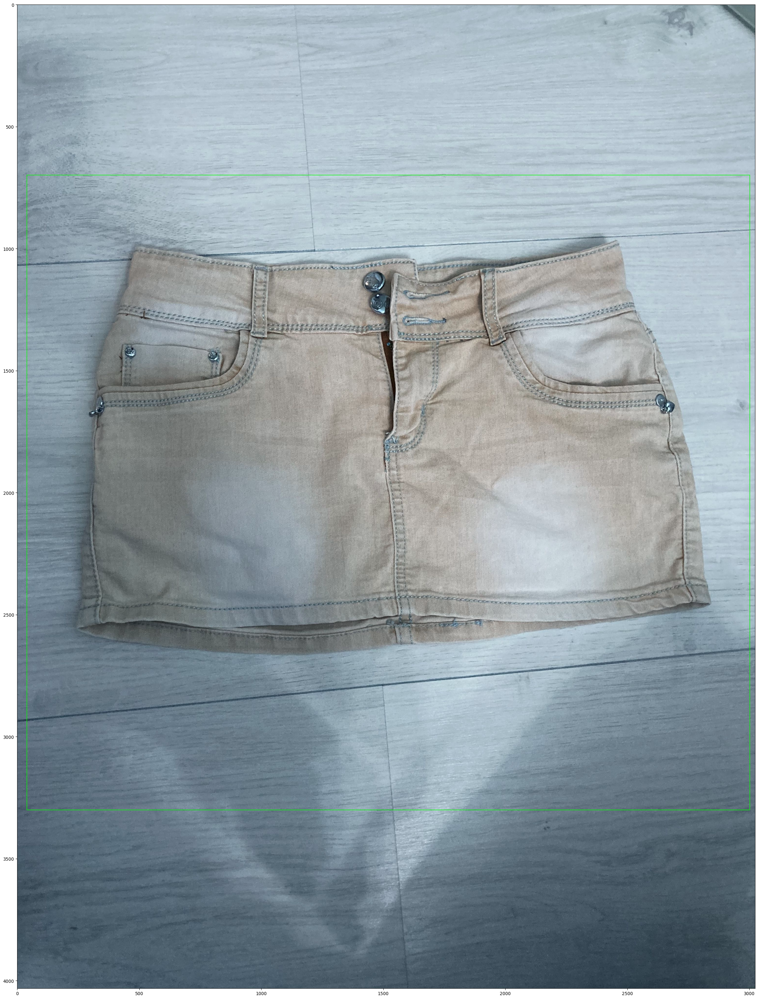

In [31]:
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage
bbs = BoundingBoxesOnImage([
 BoundingBox(x1=40, x2=3000, y1=700, y2=3300)
], shape=img.shape)
ia.imshow(bbs.draw_on_image(img, size=2))